In [1]:
%load_ext autoreload
%autoreload 2


import scanpy as sc
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from diptest import diptest
from scipy.sparse import csr_matrix
import anndata as ad
import math
import scvi
from dotenv import load_dotenv; load_dotenv()
import json
import os
import ipynbname
import shutil


from utils import preprocessing

# Hyperparamyters
BASE_PATH = os.getenv("BASE_PATH_FOR_SAVING")
DISEASE_TYPE = "diseased" # diseased / healthy
SAMPLE_ID = "sample_01"
BCL = "240805_SL-EXD_0328_B22FKKYLT4"

LIBRARIES = ["SI-TT-H1", "SI-TT-H2", "SI-TT-H3"]

# Scanvi integration Hyperpartamters
CELL_TYPE_ANNOTATION_LEVEL_SCANVI = "Class_name"
BATCH_SIZE=512
SCVI_EPOCHS = 100
SCANVI_EPOCHS = int(SCVI_EPOCHS/5)
SCANVI_LATENT_KEY = "X_scANVI"
N_SAMPLES_PER_LABEL =  200

# Load adata

In [2]:
adata_list = []

for lib in tqdm(LIBRARIES):
    ADATA_PATH = f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/{BCL}/{lib}/adata/reprocessed_filtered_adata.h5ad'
    adata = sc.read_h5ad(ADATA_PATH)

    # Create minimal adata
    adata.obs = adata.obs[['x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 
                           
                           'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 
                           'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 
                           'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability',
                           'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability',
                           'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability',

                           'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 
                           
                           'my_hierarchy_all']]
    
    adata.var = adata.var[['feature_types', 'genome', 'gene_symbol']]

    adata.obsm = {k: adata.obsm[k].copy() for k in ('spatial',) if k in adata.obsm}
    adata.layers = {k: adata.layers[k].copy() for k in ('counts',) if k in adata.layers}

    # add library index
    adata.obs["library"] = BCL + "---" + lib
    adata.obs["library_name"] = lib

    # make cell index unique
    adata.obs_names = adata.obs["library"] + "---" + adata.obs_names.astype(str)

    # restart from raw counts
    adata.X = adata.layers["counts"].copy()

    # add ot list
    adata_list.append(adata)

print(adata_list)

  0%|          | 0/3 [00:00<?, ?it/s]

[AnnData object with n_obs × n_vars = 27583 × 33866
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name'
    var: 'feature_types', 'genome', 'gene_symbol'
    uns: 'Class_name_colors', 'Subclass_name_colors', 'hvg', 'is_mixed_cluster_doublet_colors', 'is_oligo_doublet_colors', 'is_scrublet_doublet_colors', 'leiden_1', 'leiden

# Concat

In [3]:
# Save var info from first dataset before concat
var_info = adata_list[0].var[['feature_types', 'genome', 'gene_symbol']].copy()

# Concate
adata = sc.concat(adata_list, 
                  #label='library',
                  # Not aligned to the concatenation axis (i.e., things in .uns, .var, .varm, .obsm, etc.) are selected/combined
                  index_unique='-' ,
                  keys=LIBRARIES,
                  join='inner')  # keeps COMMON genes
del adata_list

# Restore var info for common genes
adata.var = var_info.loc[adata.var_names]

print(adata)
display(adata.obs.head(3))
display(adata.var.head(3))
assert adata.obs_names.is_unique, "ERROR: adata.obs_names are not unique!"


AnnData object with n_obs × n_vars = 85645 × 32780
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name'
    var: 'feature_types', 'genome', 'gene_symbol'
    obsm: 'spatial'
    layers: 'counts'


,x,y,pct_intronic,is_cell,dbscan_clusters,dbscan_score,has_spatial,Neighborhood_name,Neighborhood_bootstrapping_probability,Neighborhood_aggregate_probability,...,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,my_hierarchy_all,library,library_name
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAAAGCATGGAG-1-SI-TT-H1,21225.159553,4193.340108,0.596834,True,1,0.942997,True,Nonneuron,1.0,1.0,...,2180,7.687539,4352,8.378621,3,1.386294,0.068934,microglia,240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1,SI-TT-H1
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAAAGGCGGAGT-1-SI-TT-H1,16429.015488,3852.143369,0.716821,True,1,0.936590,True,Nonneuron,1.0,1.0,...,2406,7.786136,6496,8.779096,0,0.000000,0.000000,oligo,240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1,SI-TT-H1
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAAAGGTCTATG-1-SI-TT-H1,43242.438818,-1822.457007,0.609493,True,0,0.366933,False,Nonneuron,1.0,1.0,...,827,6.719013,1710,7.444833,0,0.000000,0.000000,astrocyte,240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1,SI-TT-H1


,feature_types,genome,gene_symbol
ensembl_id,,,
ENSG00000243485,Gene Expression,GRCh38,MIR1302-2HG
ENSG00000290826,Gene Expression,GRCh38,ENSG00000290826
ENSG00000238009,Gene Expression,GRCh38,ENSG00000238009


# Preprocess

Expect .X is raw counts!
Normalizing...


Findingn HVGs...


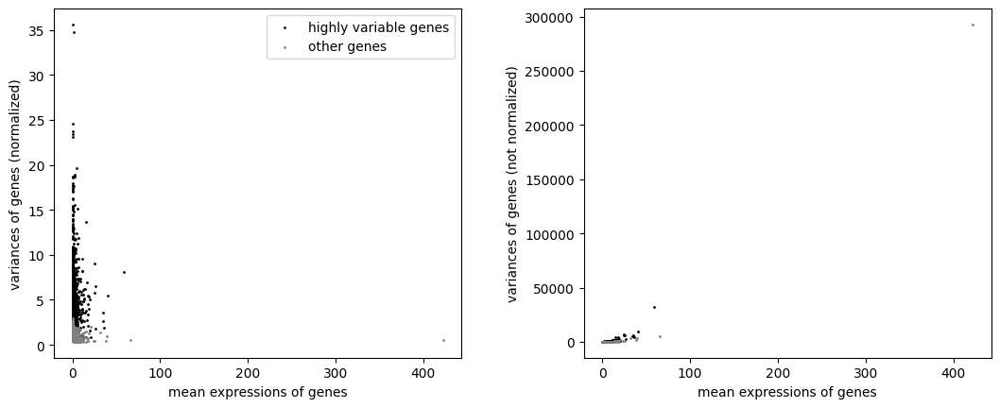

Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...


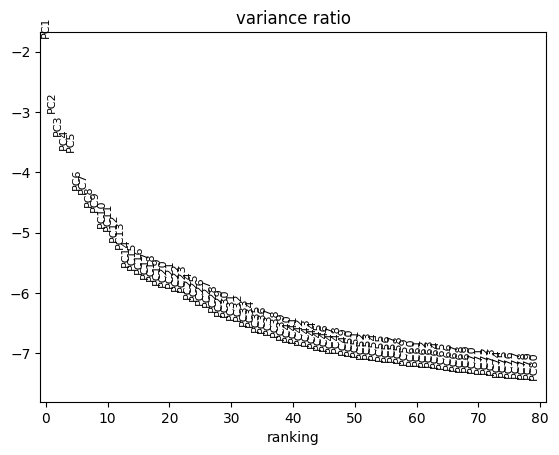

Calculating neightbors...
Calculating Umap...
Clutering...
Preprocessing done.


In [4]:
# ATTNETION: hvg using batch cov
preprocessing.preprocess(adata, n_pcs_elbow=30, n_hvg=3000, hvg_layer='counts', hvg_batch_key="library")

# Plot

/tmp/ipykernel_982173/2802814584.py:16: FutureWarning: Categorical.to_list is deprecated and will be removed in a future version. Use obj.tolist() instead
  for i, lib in enumerate(adata.obs.library_name.unique().to_list(), start=1):


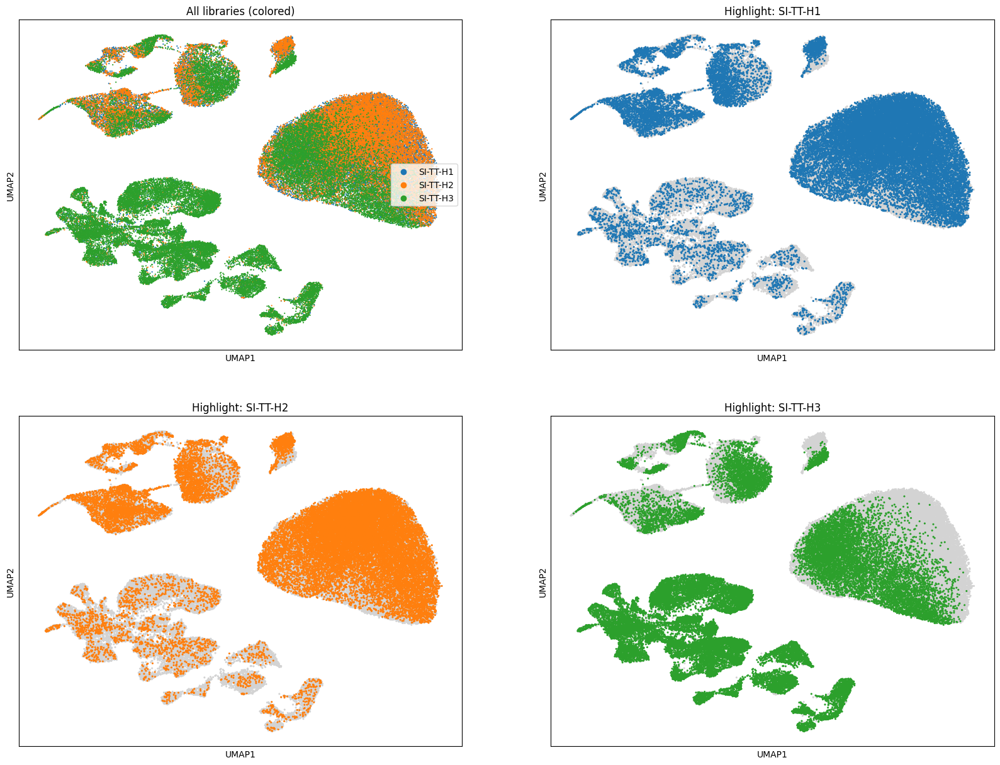

In [5]:
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.flatten()

# 1) Combined plot: color by library
sc.pl.umap(
    adata,
    color="library_name",
    ax=axes[0],
    legend_loc="right",
    title="All libraries (colored)",
    show=False,
    size=10
)

# 2..4) Highlight each selected library (colored) and gray-out others
for i, lib in enumerate(adata.obs.library_name.unique().to_list(), start=1):

    sc.pl.umap(
        adata,
        color="library_name",
        ax=axes[i],
        title=f"Highlight: {lib}",
        legend_loc=None,
        show=False,
        size=20,
        groups=[lib],
    )

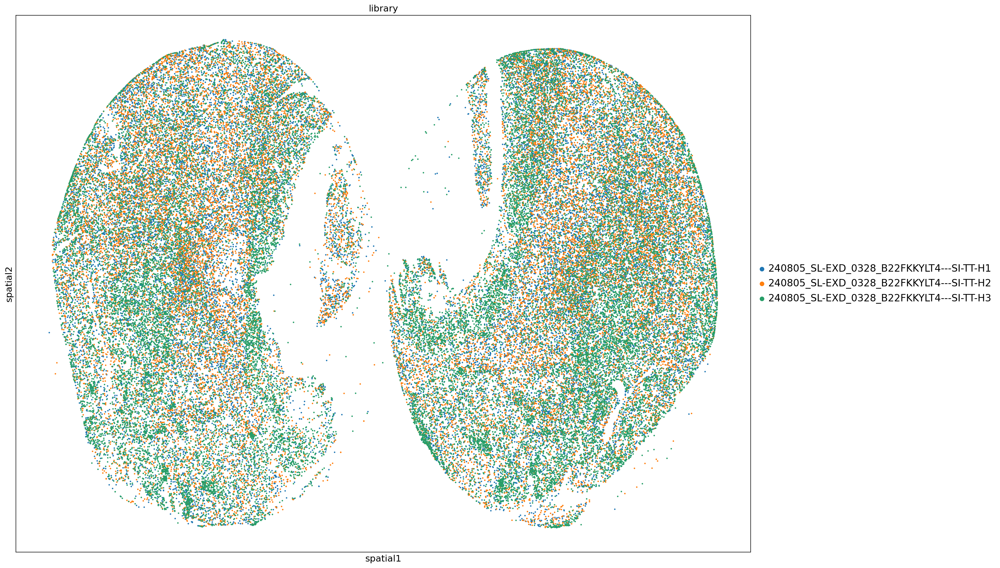

In [6]:
sc.settings.set_figure_params(figsize=(20, 15))  # increase size globally
sc.pl.embedding(
    adata,
    color=["library"],
    legend_fontsize=15,
    size=20,
    ncols=1,
    basis="spatial",
    #legend_loc="on data"
)

# scANVI Intergration

## Check scanvi requirements

In [7]:
# same genes name

# cuunt matrix
x = adata.layers["counts"][1, :1000].toarray().flatten()
x[x != 0]

array([ 1,  1,  3,  1,  6,  3,  4,  2,  1,  1,  4,  1,  1,  2,  2,  1,  1,
        1,  1,  3,  1,  1,  1,  1,  2,  1,  1,  3,  5,  1,  1,  2,  1,  4,
        1,  1,  1,  1,  1,  1,  1,  3,  1,  1,  2,  1,  1,  1,  1,  2,  7,
        1,  3,  6,  2,  2,  3, 45,  2,  1,  6,  3,  1])

In [8]:
# Make adata with HVG only
adata_hvg = adata[:, adata.var.highly_variable].copy()

## Train scVI

In [9]:
# Initialise adata 
scvi.model.SCVI.setup_anndata(
    adata_hvg,
    layer='counts', # ATTTENTION NEEDS RAW COUNTS
    batch_key='library',
    # labels_key=None,          # Optional: cell type labels (not used in scVI)
    # categorical_covariate_keys=None,  # Additional covariates
    # continuous_covariate_keys=None    # Continuous covariates
)

# create scVI object (unsupervised)
scvi_model = scvi.model.SCVI(
    adata_hvg,
    n_latent=30,
    n_layers=2,
)

# train
scvi_model.train(
    max_epochs=SCVI_EPOCHS, 
    early_stopping=True,
    batch_size=BATCH_SIZE,
    datasplitter_kwargs={'num_workers': 16}
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


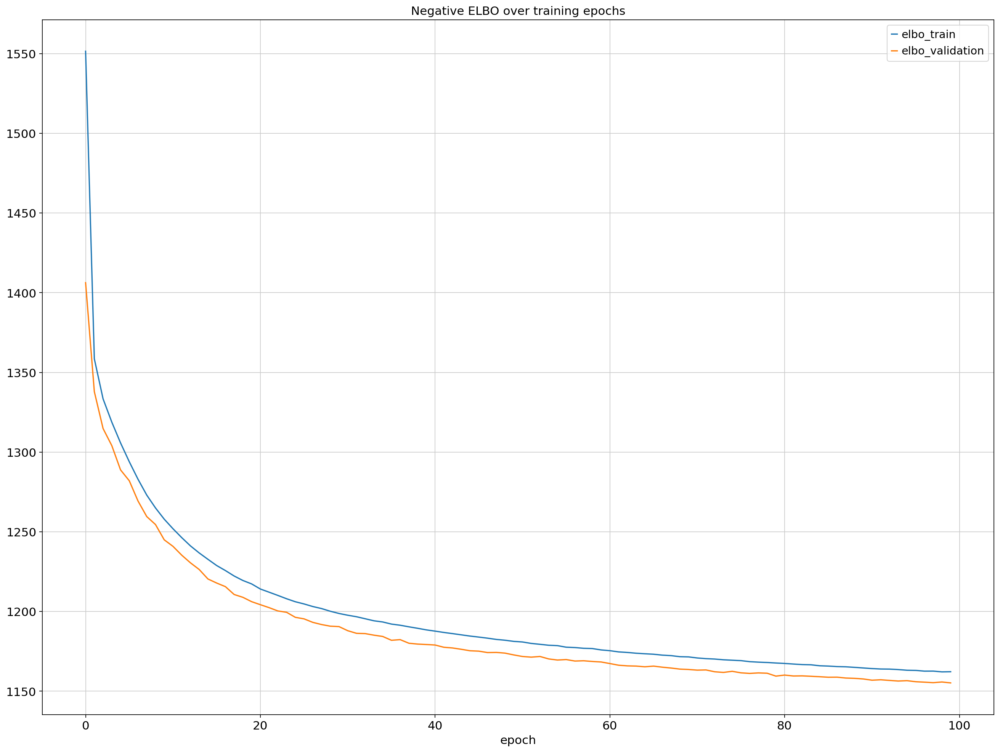

In [10]:
fig, ax = plt.subplots(1, 1)
scvi_model.history["elbo_train"].plot(ax=ax, label="train")
scvi_model.history["elbo_validation"].plot(ax=ax, label="validation")
ax.set(title="Negative ELBO over training epochs")
ax.legend()

## Train on top scANVI

In [11]:
print(adata_hvg.obs[CELL_TYPE_ANNOTATION_LEVEL_SCANVI].value_counts().tail(10))

# Count cell types and get min class size
n_cell_types = adata_hvg.obs[CELL_TYPE_ANNOTATION_LEVEL_SCANVI].nunique()
min_class_size = adata_hvg.obs[CELL_TYPE_ANNOTATION_LEVEL_SCANVI].value_counts().min()
# Choose n_samples_per_label (use 80% of smallest class to be safe)
n_samples_per_label = N_SAMPLES_PER_LABEL #int(min_class_size * 0.8)
print(f"\nUsing n_samples_per_label = {n_samples_per_label}")

Class_name
CN LGE GABA     12701
Astro-Epen       5963
Immune           5417
F M GABA         4679
CN MGE GABA      4009
Vascular         2197
F M Glut          866
CN CGE GABA       665
Cx GABA           258
CN GABA-Glut        1
Name: count, dtype: int64

Using n_samples_per_label = 200


In [12]:
# Intialize scanvi model from scvi
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata_hvg, # ATTENTION: scANVI should be initialized from a scVI model pre-trained on the same exact data.
    labels_key=CELL_TYPE_ANNOTATION_LEVEL_SCANVI,
    unlabeled_category='Unknown'
)

# train 
scanvi_model.train(
    max_epochs=SCANVI_EPOCHS, 
    batch_size=BATCH_SIZE,
    n_samples_per_label=n_samples_per_label,  # Sample exactly 100 cells per cell type PER EPOCH
    datasplitter_kwargs={'num_workers': 16},
    plan_kwargs={
        "lr": 5e-4, # low
        'n_epochs_kl_warmup': 10,  # Warmup over 10 epochs
        },
    early_stopping=True) # lees epochs as starts form pretrained


INFO     Training for 20 epochs.                                                                                   


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 2 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/scvi/data/fields/_scanvi.py:56: UserWarning: Category 2 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/20 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


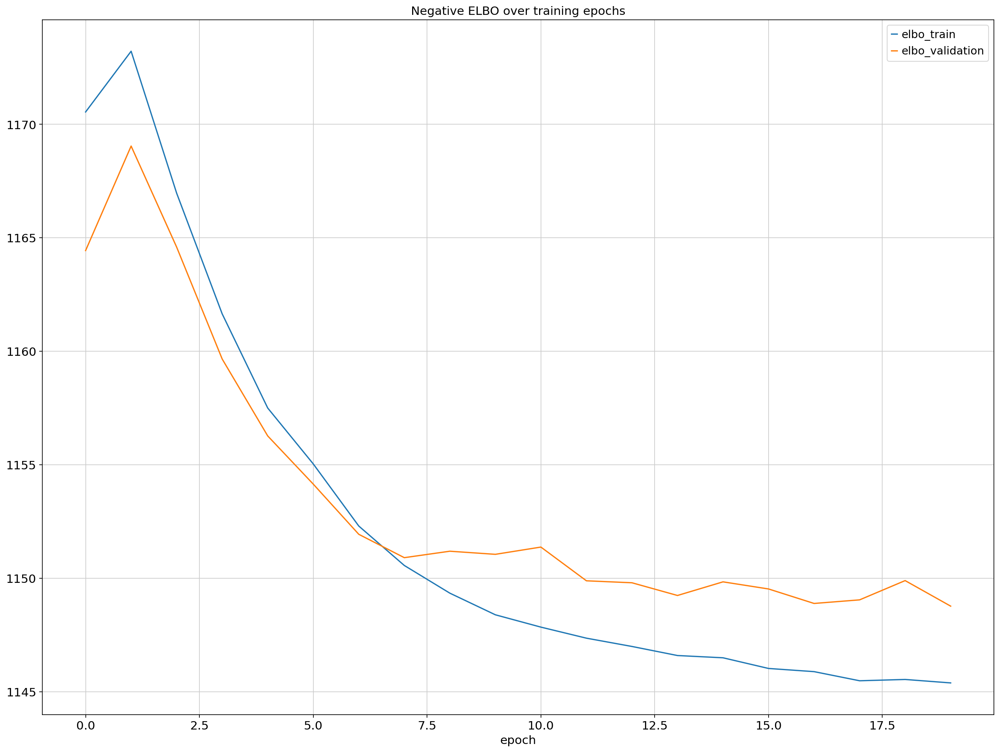

In [13]:
fig, ax = plt.subplots(1, 1)
scanvi_model.history["elbo_train"].plot(ax=ax, label="train")
scanvi_model.history["elbo_validation"].plot(ax=ax, label="validation")
ax.set(title="Negative ELBO over training epochs")
ax.legend()

## Process Latent space

In [14]:
# Save latent
    #ATTENTION: put in old adata --> cells in same order??
assert (adata.obs_names == adata_hvg.obs_names).all(), "Cell order mismatch!"
adata.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation() # latnet embs (sort ot PCA)
#adata.layers['scANVI_normalized'] = scanvi_model.get_normalized_expression() # corrected NORMALISED counts

# compute UMAP
sc.pp.neighbors(adata, use_rep=SCANVI_LATENT_KEY, key_added='scANVI_neighbors')
sc.tl.umap(adata, neighbors_key='scANVI_neighbors', key_added='scANVI_umap')
sc.tl.leiden(adata, resolution=1.0, key_added="leiden_scANVI", flavor="igraph", n_iterations=2, neighbors_key='scANVI_neighbors')


## Plot

/tmp/ipykernel_982173/738449846.py:17: FutureWarning: Categorical.to_list is deprecated and will be removed in a future version. Use obj.tolist() instead
  for i, lib in enumerate(adata.obs.library_name.unique().to_list(), start=1):


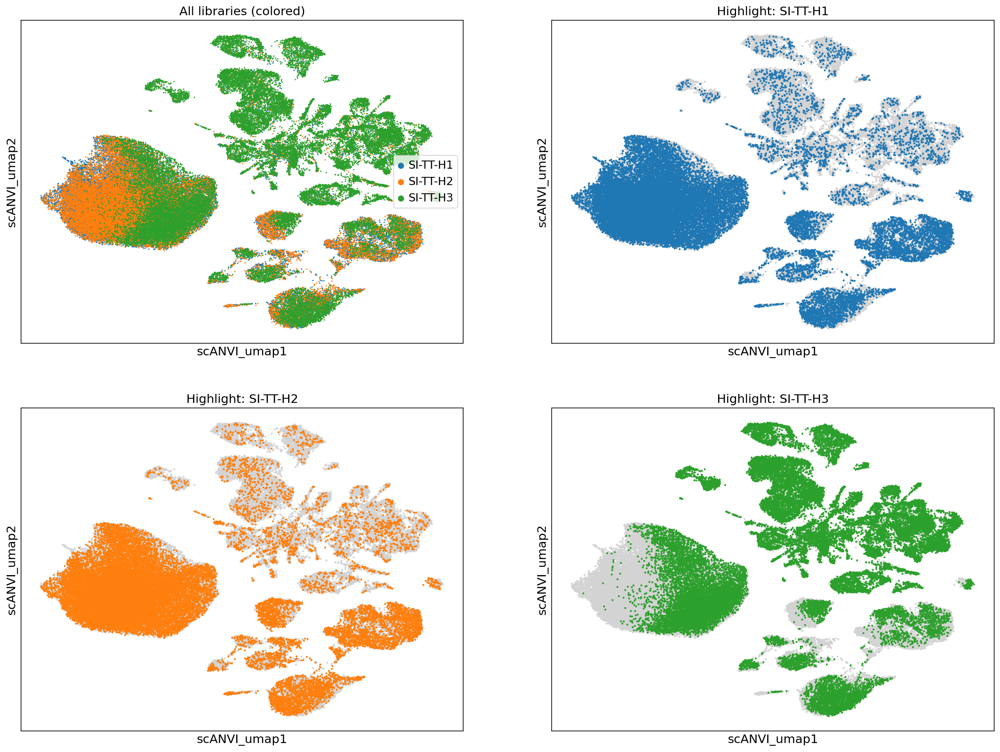

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.flatten()

# 1) Combined plot: color by library
sc.pl.embedding(
    adata,
    color="library_name",
    ax=axes[0],
    legend_loc="right",
    title="All libraries (colored)",
    show=False,
    size=10, 
    basis='scANVI_umap' #ATTNETION, use this Base
)

# 2..4) Highlight each selected library (colored) and gray-out others
for i, lib in enumerate(adata.obs.library_name.unique().to_list(), start=1):

    sc.pl.embedding(
        adata,
        color="library_name",
        ax=axes[i],
        title=f"Highlight: {lib}",
        legend_loc=None,
        show=False,
        size=20,
        groups=[lib],
        basis='scANVI_umap'
    )

<Axes: title={'center': 'All libraries (colored)'}, xlabel='scANVI_umap1', ylabel='scANVI_umap2'>

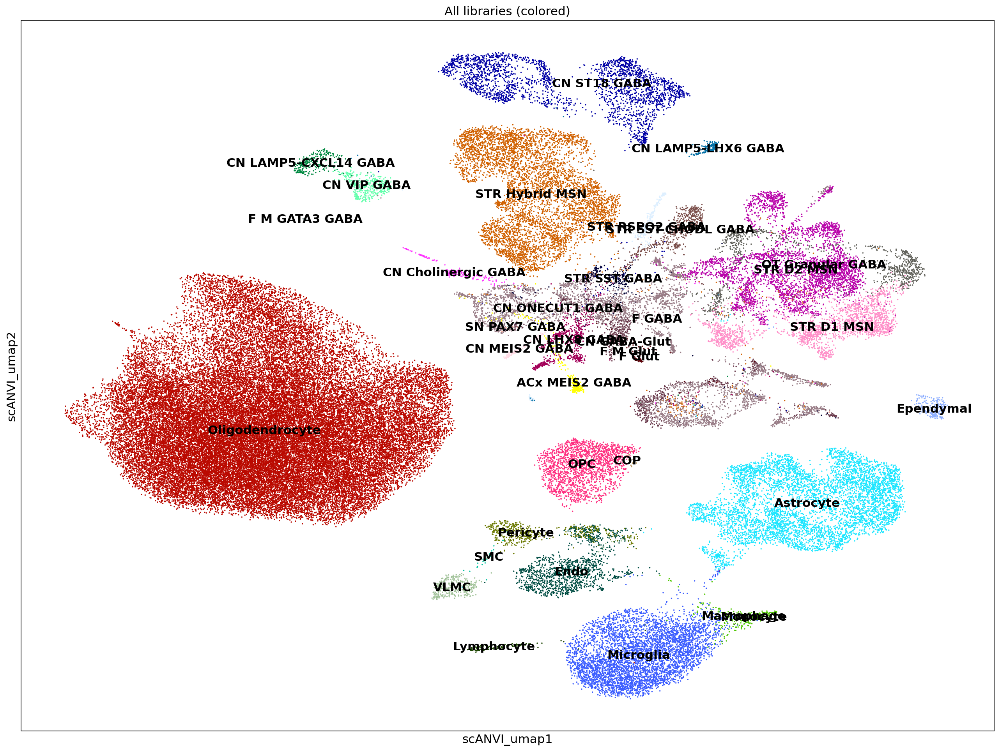

In [23]:
sc.settings.set_figure_params(figsize=(20, 15)) 

sc.pl.embedding(
    adata,
    color="Subclass_name",
    legend_loc="on data",
    title="All libraries (colored)",
    show=False,
    size=10, 
    basis='scANVI_umap' #ATTNETION, use this Base
)

# Save Adata

In [17]:
adata.write(f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata.h5ad')
adata

# # 2. Save scVI model
# vae.save('scvi_model/', overwrite=True)

# # 3. Save scANVI model
# lvae.save('scanvi_model/', overwrite=True)

AnnData object with n_obs × n_vars = 85645 × 32780
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI'
    var: 'feature_types', 'genome', 'gene_symbol', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatche

# Save Notebook

In [24]:
# Get the notebook path
notebook_path = str(ipynbname.path())
print(f"Current notebook: {notebook_path}")

# Save it
base_name = os.path.basename(notebook_path).replace('.ipynb', '')  # Remove .ipynb
saving_path = f"{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/notebooks/{base_name}.ipynb"
print(f"Saved to {saving_path}")

print("\n   Press Ctrl+S")

Current notebook: /home/gdallagl/myworkdir/XDP/script/single_sample_analysis/04_merge_and_integrate_libraries.ipynb
Saved to /home/gdallagl/myworkdir/data/XDP/diseased/sample_01/notebooks/04_merge_and_integrate_libraries.ipynb

   Press Ctrl+S


In [25]:
shutil.copy(notebook_path, saving_path)

'/home/gdallagl/myworkdir/data/XDP/diseased/sample_01/notebooks/04_merge_and_integrate_libraries.ipynb'